In [1]:
from __future__ import print_function
from __future__ import division
from __future__ import absolute_import
from __future__ import unicode_literals

import os
import sys

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
sns.set()
sns.set_style("whitegrid")
sns.set_context("poster")

mpl.rcParams['figure.figsize'] = [8.0*2, 6.0*2]
mpl.rcParams['figure.dpi'] = 80
mpl.rcParams['savefig.dpi'] = 100

mpl.rcParams['font.size'] = 30
mpl.rcParams['axes.labelsize'] = 30
mpl.rcParams['ytick.labelsize'] = 30
mpl.rcParams['xtick.labelsize'] = 30
mpl.rcParams['legend.fontsize'] = 'large'
mpl.rcParams['figure.titlesize'] = 'medium'



# Introduction

On fait des plots sur les runs

In [3]:
from problem.workflow import pprint

## Data

In [4]:
from problem.higgs_geant import load_data

In [5]:
print('Loading data ...')
data, _ = load_data()
print('Done !')

Loading data ...
Done !


In [6]:
data.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,197.760,...,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.000814,1.0
1,160.937,68.768,103.235,48.146,0.00,0.000,0.000,3.473,2.078,125.157,...,1,46.226,0.725,1.158,0.000,0.00,0.000,46.226,0.681042,0.0
2,0.000,162.172,125.953,35.635,0.00,0.000,0.000,3.148,9.336,197.814,...,1,44.251,2.053,-2.028,0.000,0.00,0.000,44.251,0.715742,0.0
3,143.905,81.417,80.943,0.414,0.00,0.000,0.000,3.310,0.414,75.968,...,0,0.000,0.000,0.000,0.000,0.00,0.000,-0.000,1.660654,0.0
4,175.864,16.915,134.805,16.405,0.00,0.000,0.000,3.891,16.405,57.983,...,0,0.000,0.000,0.000,0.000,0.00,0.000,0.000,1.904263,0.0


## Load models

In [7]:
from problem.higgs_geant import get_save_directory
from problem.higgs_geant import skew
from problem.higgs_geant import tangent
from problem.higgs_geant import get_cv_iter
from problem.higgs_geant import skewing_function


In [8]:
def load_models(model_class, *args, **kwargs):
    models = []
    cv_iter = get_cv_iter(data, data['Label'])
    n_cv = len(cv_iter)
    pprint('Loading', n_cv, model_class.__name__)
    for i in range(n_cv):
        model = model_class(*args, **kwargs)
        save_directory = get_save_directory()
        model_name = '{}-{}'.format(model.get_name(), i)
        path = os.path.join(save_directory, model_name)
        model.load(path)
        models.append(model)
    return models

In [9]:
from models.higgsml import NeuralNetModel
from models.higgsml import AugmentedNeuralNetModel
from models.higgsml import TangentPropModel
from models.higgsml import AugmentedTangentPropModel
from models.higgsml import PivotModel


In [10]:
NN_models = load_models(NeuralNetModel, n_steps=10000, batch_size=1024, cuda=True)
ANN_models = load_models(AugmentedNeuralNetModel, skewing_function=skew, n_augment=5,
                         batch_size=1024, n_steps=10000, width=0.03, cuda=True)
TP_models = load_models(TangentPropModel, skewing_function=skew, trade_off=0.01, 
                        batch_size=1024, n_steps=10000, cuda=True )
PAN_models = load_models(PivotModel, skewing_function=skew, batch_size=1024, n_recovery_steps=5,
                         n_clf_pre_training_steps=3000, n_adv_pre_training_steps=3000, n_steps=10000,
                         width=0.01, trade_off=1.0, cuda=True)


2018-09-27 10:39:30 Loading 12 NeuralNetModel
2018-09-27 10:39:34 Loading 12 AugmentedNeuralNetModel


/usr/local/lib/python3.5/dist-packages/sklearn/base.py:312: UserWarning: Trying to unpickle estimator StandardScaler from version 0.18.1 when using version 0.19.0. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


2018-09-27 10:39:34 Loading 12 TangentPropModel
2018-09-27 10:39:35 Loading 12 PivotModel


In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.autograd import Variable

from models.net.minibatch import OneEpoch
from models.net.utils import make_variable

from problem.higgs_geant import split_data_label_weights
from problem.higgs_geant import split_train_test


In [12]:
def pandas_to_numpy(array_or_dataframe):
    if isinstance(array_or_dataframe, pd.core.generic.NDFrame):
        return array_or_dataframe.values
    else:
        return array_or_dataframe


In [13]:
def fast_gradient_sign_adversarial_noise(model, X_sample, y_sample, epsilon=0.1, batch_size=256):
    X_noise = []
    if hasattr(model, 'net'):
        net = model.net
    elif hasattr(model, 'jnet'):
        net = model.jnet
    elif hasattr(model, 'dnet'):
        net = model.dnet
    scaler = model.scaler
    X_sample = model.scaler.transform(X_sample)
    batch_gen = OneEpoch(X_sample, y_sample, batch_size=batch_size)
    for X_batch, y_batch in batch_gen:
        X_var = Variable(torch.FloatTensor(X_batch), requires_grad=True)
        X_var_cuda = X_var.cuda()
        y_var = Variable(torch.LongTensor(y_batch), requires_grad=False).cuda()
        net.zero_grad()
        if hasattr(model, 'jnet'):
            outputs, _ = net(X_var_cuda, X_var_cuda)
        else:
            outputs = net(X_var_cuda)
        loss = F.cross_entropy(outputs, y_var)
        loss.backward()
        X_perturb = epsilon * torch.sign(X_var.grad.data)
        X_noise.append(X_perturb.cpu().numpy())
    X_noise = np.concatenate(X_noise, axis=0)
    return X_noise


# Find adversarial perturbation

## All events


In [133]:
i = 0
cv_iter = get_cv_iter(data, data['Label'])
idx_dev, idx_valid = cv_iter[i]

_, test_data =  split_train_test(data, idx_dev, idx_valid)
test_data = skewing_function(test_data, z=1.0)
X_test, y_test, W_test = split_data_label_weights(test_data)
columns_names = X_test.columns
X_tan = tangent(X_test)
X_test = pandas_to_numpy(X_test)
X_tan = pandas_to_numpy(X_tan)
y_test = pandas_to_numpy(y_test)

# Choose model
model = TP_models[i]
model_name = 'Tangent Prop'
if hasattr(model, 'classifier'):
    model.clf = model.classifier

n_samples = X_test.shape[0]

# Produce adversarial attacks
X_noise = fast_gradient_sign_adversarial_noise(model, X_test, y_test, epsilon=0.1)

# Find TES variables
skewed_var_idx = [i for i in range(X_tan.shape[1]) if np.count_nonzero(X_tan[:, i]) > 0]

# Adversarial attacks on TES variables only
X_noise_TES = np.zeros_like(X_noise)
for i in skewed_var_idx:
    X_noise_TES[:, i] = np.copy(X_noise[:, i])

# Get normalized data
X_test_u = model.scaler.transform(X_test)


signal_idx = (y_test == 1)
background_idx = (y_test == 0)
signals_weights = W_test[signal_idx]
backgrounds_weights = W_test[background_idx]


## On selected events

In [134]:
from experiment import decision_TP_FP
from higgs_metrics import error_stat
from higgs_metrics import error_syst
from higgs_metrics import sigma_mu
from higgs_metrics import merge_abscisse


In [135]:
print(model_name)
# get perfect selection
CHOSEN_TES = 1.03

decision = model.predict_proba(X_test)[:, 1]
decision_sorted, s0, b0 = decision_TP_FP(decision, y_test, W_test)

test_data_skewed = skewing_function(test_data, z=CHOSEN_TES)
X_test_skewed, y_test_skewed, W_test_skewed = split_data_label_weights(test_data_skewed)
X_test_skewed = pandas_to_numpy(X_test_skewed)
decision_skewed = model.predict_proba(X_test_skewed)[:, 1]
decision_skewed_sorted, s, b = decision_TP_FP(decision_skewed, y_test_skewed, W_test_skewed)


merged_decision, indexes = merge_abscisse(decision_sorted, decision_skewed_sorted)
idx_0 = indexes[0]
idx_skewed = indexes[1]
s0 = s0[idx_0]
b0 = b0[idx_0]
s = s[idx_skewed]
b = b[idx_skewed]

estat = error_stat(s0, b0)
esyst = error_syst(s, b, s0, b0)
smu = sigma_mu(s, b, s0, b0)

idx_min = np.argmin(smu)
decision_threshold = merged_decision[idx_min]
print('decision_threshold =', decision_threshold)
print('smu min', np.min(smu))

idx_selected = decision > decision_threshold
X_test_selected = X_test[idx_selected]
X_test_u_selected = X_test_u[idx_selected]
y_test_selected = y_test[idx_selected]
W_test_selected = W_test[idx_selected]

X_tan_selected = X_tan[idx_selected]
X_noise_selected = X_noise[idx_selected]
X_noise_TES_selected = X_noise_TES[idx_selected]

print('kept {:2.1f} % of the events'.format(X_test_selected.shape[0]/X_test.shape[0]*100))

selected_signal_idx = (y_test_selected == 1)
selected_background_idx = (y_test_selected == 0)
selected_signals_weights = W_test_selected[selected_signal_idx]
selected_backgrounds_weights = W_test_selected[selected_background_idx]

print('{} ({}) signals kept'.format(np.sum(selected_signal_idx), np.sum(selected_signals_weights)))
print('{} ({}) backgrounds kept'.format(np.sum(selected_background_idx), np.sum(selected_backgrounds_weights)))


Tangent Prop
decision_threshold = 0.98244655
smu min 0.610629405582225
kept 3.3 % of the events
4597 (30.071572326490674) signals kept
132 (253.3119186915399) backgrounds kept


In [96]:
idx_skewed_selected = decision_skewed > decision_threshold
W_test_skewed_selected = W_test_skewed[idx_skewed_selected]
y_test_skewed_selected = y_test_skewed[idx_skewed_selected]
print('{} ({}) signals kept'.format(np.sum(y_test_skewed_selected == 1), 
                                    np.sum(W_test_skewed_selected[y_test_skewed_selected == 1])))
print('{} ({}) backgrounds kept'.format(np.sum(y_test_skewed_selected == 0), 
                                        np.sum(W_test_skewed_selected[y_test_skewed_selected == 0])))


6564 (48.9509904777907) signals kept
259 (445.51679861762557) backgrounds kept


In [67]:
simulation_b0 = np.sum(selected_backgrounds_weights)
prediction_s_b = np.sum(W_test_skewed_selected)

print('predicted sig number', (prediction_s_b - simulation_b0))
print('predicted sig rate', (prediction_s_b - simulation_b0)/prediction_s_b)
print('real sig rate', (np.sum(signals_weights))/(np.sum(signals_weights) + np.sum(backgrounds_weights)))



predicted sig number 48.46573868623341
predicted sig rate 0.06163314277142364
real sig rate 0.0019968465784870903


In [68]:
print('counting error', simulation_b0 - np.sum(W_test_skewed_selected[y_test_skewed_selected == 0]))

counting error 17.57470327006581


In [69]:
print(np.linalg.norm(X_noise[1]), np.linalg.norm(X_test[1]), np.linalg.norm(X_test_u[1]))
print(np.linalg.norm(X_noise[2]), np.linalg.norm(X_test[2]), np.linalg.norm(X_test_u[2]))
print(np.linalg.norm(X_noise[3]), np.linalg.norm(X_test[3]), np.linalg.norm(X_test_u[3]))
print(np.linalg.norm(X_noise[9]), np.linalg.norm(X_test[9]), np.linalg.norm(X_test_u[9]))


0.5385165 329.35941999736394 3.3732493431031654
0.5385165 639.2906482399067 6.575040676778014
0.5385165 184.42738137543458 3.346345522761832
0.5385165 244.14205087407618 3.4012265346897514


In [70]:
y_pred = model.predict(X_test)
y_pred_adv = model.predict( X_test + X_noise )

print('{:.2f} % accuracy before'.format(np.mean(y_pred == y_test) *100))
print('{:.2f} % accuracy after'.format(np.mean(y_pred_adv == y_test) *100))
print('{:.2f} % change classification'.format(np.mean(y_pred_adv != y_pred) *100))
print('{:.2f} % accuracy diff'.format((np.mean(y_pred == y_test) - np.mean(y_pred_adv == y_test)) * 100))
print()

y_pred = model.clf.predict(X_test_u)
y_pred_adv = model.clf.predict( X_test_u + X_noise )

print('{:.2f} % accuracy before'.format(np.mean(y_pred == y_test) *100))
print('{:.2f} % accuracy after'.format(np.mean(y_pred_adv == y_test) *100))
print('{:.2f} % change classification'.format(np.mean(y_pred_adv != y_pred) *100))
print('{:.2f} % accuracy diff'.format((np.mean(y_pred == y_test) - np.mean(y_pred_adv == y_test)) * 100))

print('Conclusion : X_test_u + X_noise is the right way to use X_noise')

76.39 % accuracy before
63.89 % accuracy after
12.50 % change classification
12.50 % accuracy diff

76.39 % accuracy before
55.60 % accuracy after
20.79 % change classification
20.79 % accuracy diff
Conclusion : X_test_u + X_noise is the right way to use X_noise


# Histograms

## On every variables

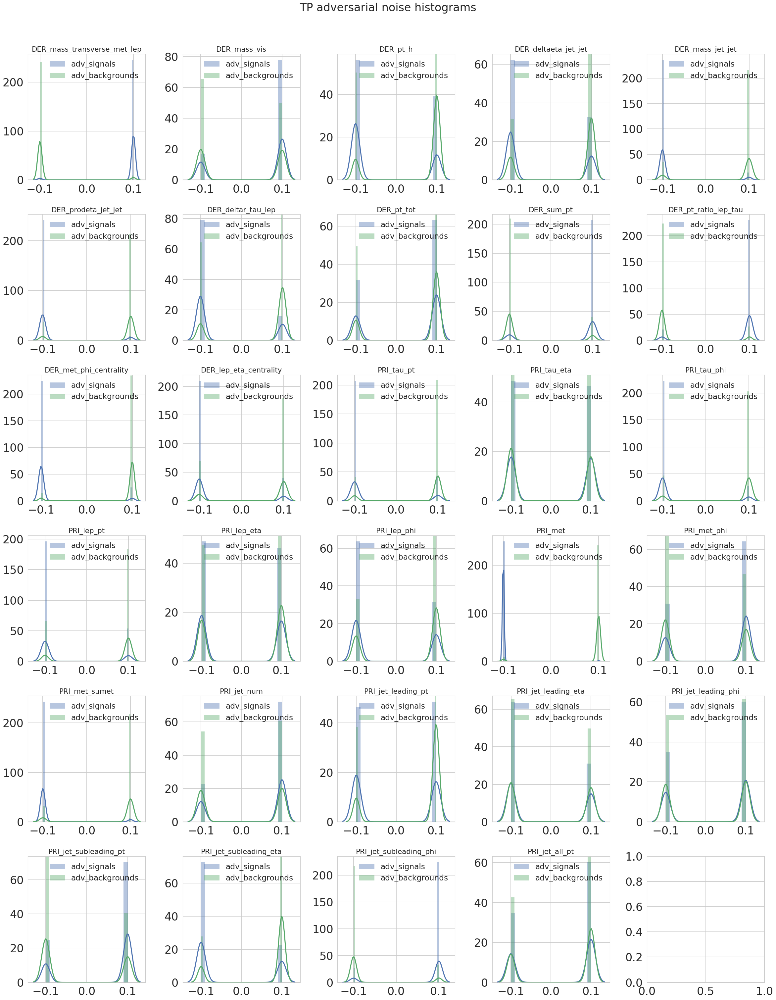

In [19]:

fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 40))
for i, (ax, col_name) in enumerate(zip(axes.ravel(), columns_names)):
    signals = X_noise[signal_idx, i]
    backgrounds = X_noise[background_idx, i]
    
    sns.distplot(signals, label='adv_signals', ax=ax, hist_kws={'weights': signals_weights})
    sns.distplot(backgrounds, label='adv_backgrounds', ax=ax, hist_kws={'weights': backgrounds_weights})

    ax.set_title(col_name)
    ax.legend(fontsize='x-small')
fig.suptitle('{} adversarial noise histograms'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

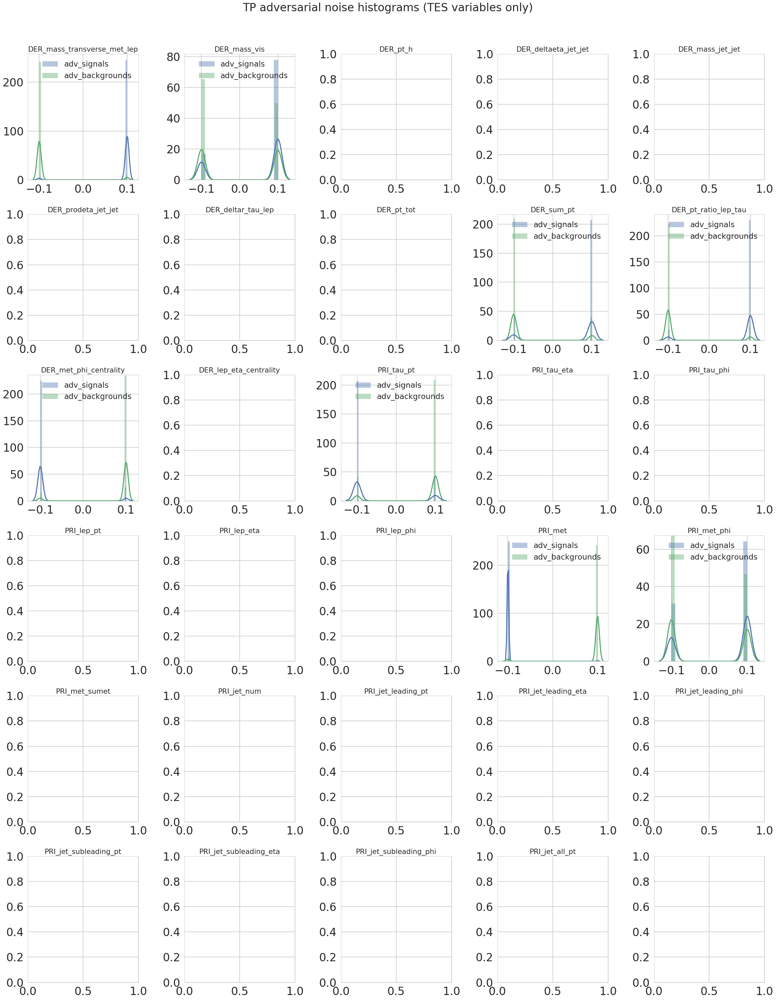

In [20]:

fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 40))
for i, (ax, col_name) in enumerate(zip(axes.ravel(), columns_names)):
    signals = X_noise_TES[signal_idx, i]
    backgrounds = X_noise_TES[background_idx, i]
    
    any_signals = np.count_nonzero(signals)
    any_backgrounds = np.count_nonzero(backgrounds)
    if any_signals > 0:
        sns.distplot(signals, label='adv_signals', ax=ax, hist_kws={'weights': signals_weights})
    if any_backgrounds > 0:
        sns.distplot(backgrounds, label='adv_backgrounds', ax=ax, hist_kws={'weights': backgrounds_weights})

    ax.set_title(col_name)
    if any_backgrounds and any_signals:
        ax.legend(fontsize='x-small')
fig.suptitle('{} adversarial noise histograms (TES variables only)'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

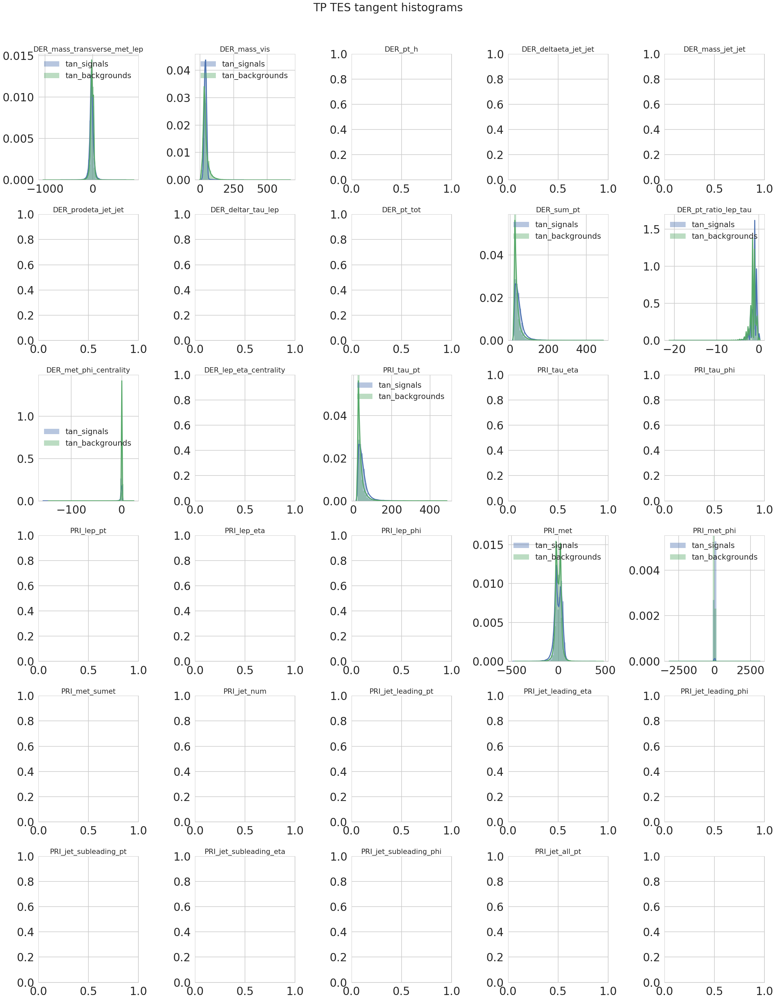

In [21]:

fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 40))
for i, (ax, col_name) in enumerate(zip(axes.ravel(), columns_names)):
    signals = X_tan[signal_idx, i]    
    backgrounds = X_tan[background_idx, i]
    
    any_signals = np.count_nonzero(signals)
    any_backgrounds = np.count_nonzero(backgrounds)
    if any_signals > 0:
        sns.distplot(signals, label='tan_signals', ax=ax, hist_kws={'weights': signals_weights})
    if any_backgrounds > 0:
        sns.distplot(backgrounds, label='tan_backgrounds', ax=ax, hist_kws={'weights': backgrounds_weights})
    ax.set_title(col_name)
    if any_signals or any_backgrounds:
        ax.legend(fontsize='x-small')
fig.suptitle('{} TES tangent histograms'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## On skewed variable only

In [22]:
signal_idx = (y_test == 1)
background_idx = (y_test == 0)
signals_weights = W_test[signal_idx]
backgrounds_weights = W_test[background_idx]


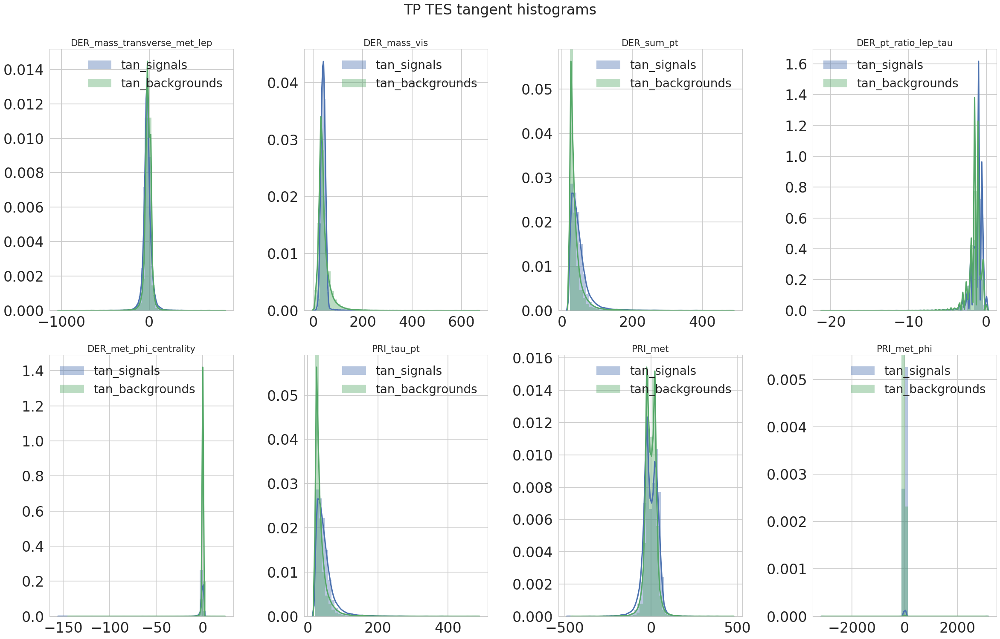

In [23]:

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(30, 20))
for i, ax in zip(skewed_var_idx, axes.ravel()):
    signals = X_tan[signal_idx, i]
    backgrounds = X_tan[background_idx, i]
    
    col_name = columns_names[i]
    sns.distplot(signals, label='tan_signals', ax=ax, hist_kws={'weights': signals_weights})
    sns.distplot(backgrounds, label='tan_backgrounds', ax=ax, hist_kws={'weights': backgrounds_weights})
    ax.set_title(col_name)
    ax.legend(fontsize='small')
fig.suptitle('{} TES tangent histograms'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()    


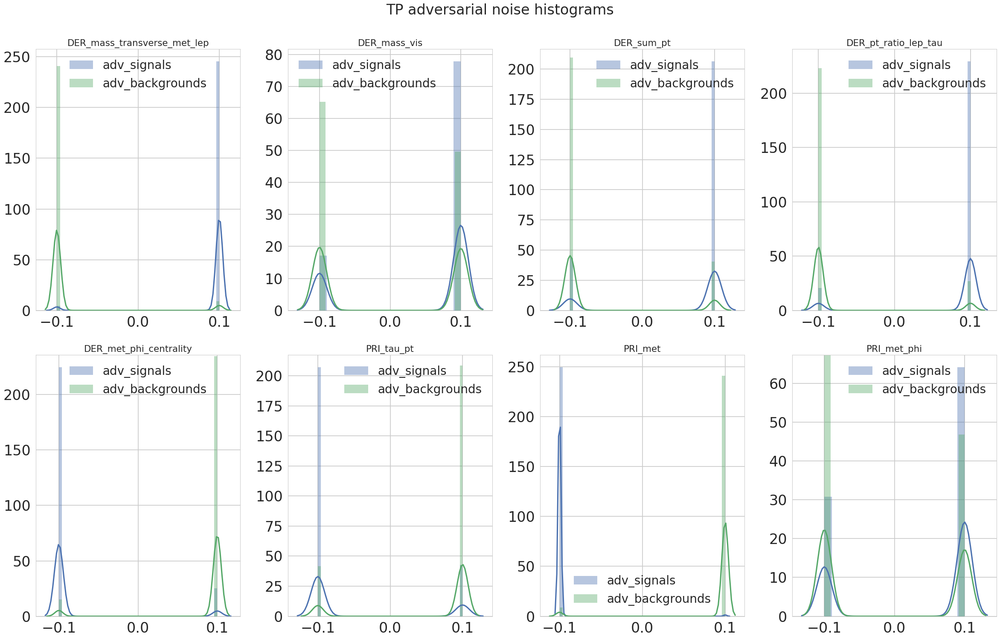

In [24]:

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(30, 20))
for i, ax in zip(skewed_var_idx, axes.ravel()):
    signals = X_noise[signal_idx, i]
    backgrounds = X_noise[background_idx, i]

    col_name = columns_names[i]
    sns.distplot(signals, label='adv_signals', ax=ax, hist_kws={'weights': signals_weights})
    sns.distplot(backgrounds, label='adv_backgrounds', ax=ax, hist_kws={'weights': backgrounds_weights})
    ax.set_title(col_name)
    ax.legend(fontsize='small')
fig.suptitle('{} adversarial noise histograms'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## On selected events

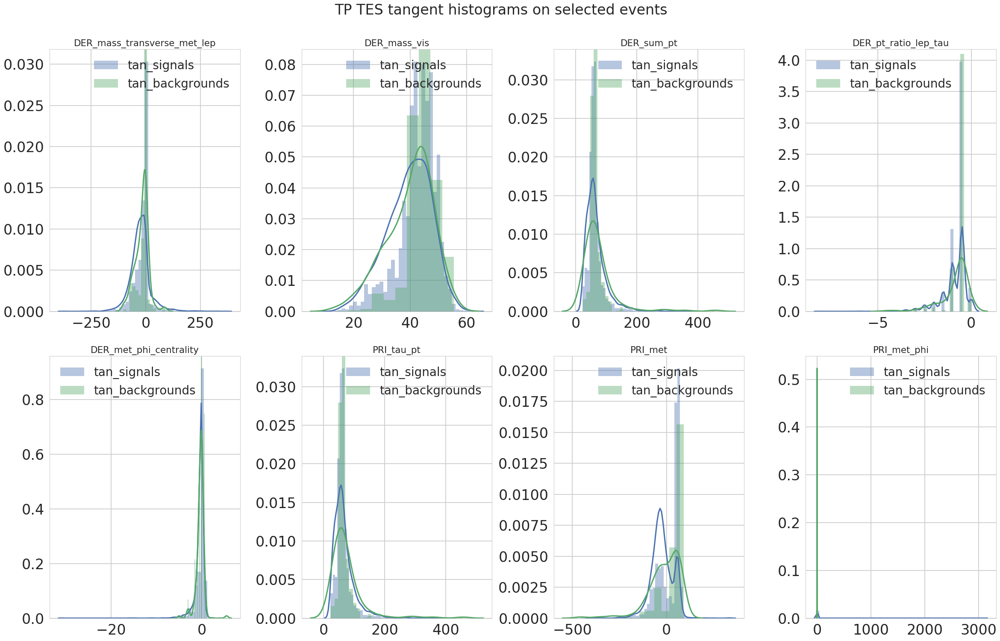

In [42]:

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(30, 20))
for i, ax in zip(skewed_var_idx, axes.ravel()):
    signals = X_tan_selected[selected_signal_idx, i]
    backgrounds = X_tan_selected[selected_background_idx, i]
    
    col_name = columns_names[i]
    sns.distplot(signals, label='tan_signals', ax=ax, hist_kws={'weights': selected_signals_weights})
    sns.distplot(backgrounds, label='tan_backgrounds', ax=ax, hist_kws={'weights': selected_backgrounds_weights})
    ax.set_title(col_name)
    ax.legend(fontsize='small')
fig.suptitle('{} TES tangent histograms on selected events'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()    


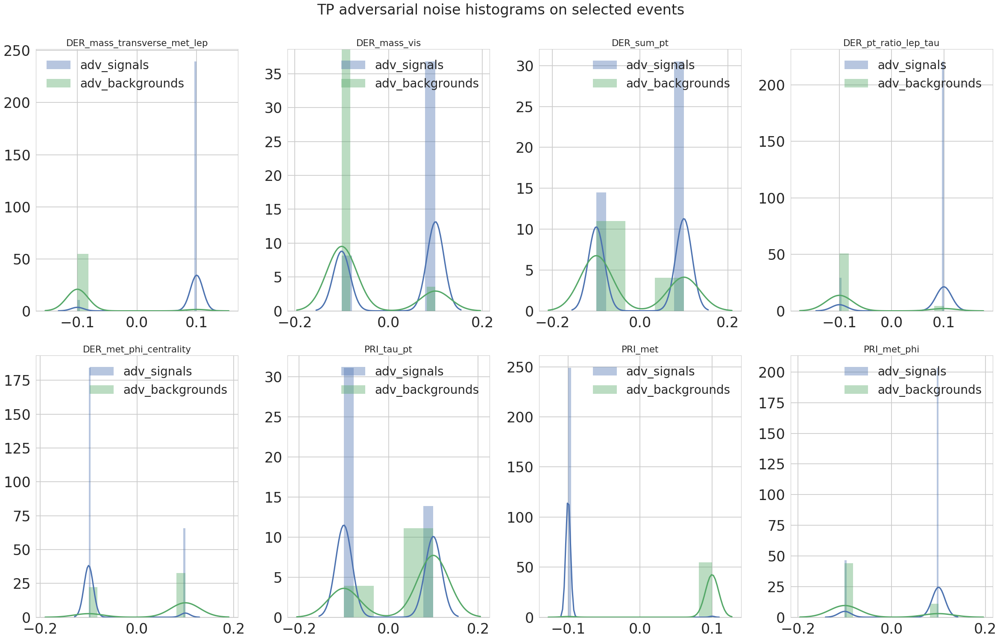

In [43]:

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(30, 20))
for i, ax in zip(skewed_var_idx, axes.ravel()):
    signals = X_noise_selected[selected_signal_idx, i]
    backgrounds = X_noise_selected[selected_background_idx, i]

    col_name = columns_names[i]
    sns.distplot(signals, label='adv_signals', ax=ax, hist_kws={'weights': selected_signals_weights})
    sns.distplot(backgrounds, label='adv_backgrounds', ax=ax, hist_kws={'weights': selected_backgrounds_weights})
    ax.set_title(col_name)
    ax.legend(fontsize='small')
fig.suptitle('{} adversarial noise histograms on selected events'.format(model_name))
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [44]:
columns_names

Index(['DER_mass_transverse_met_lep', 'DER_mass_vis', 'DER_pt_h',
       'DER_deltaeta_jet_jet', 'DER_mass_jet_jet', 'DER_prodeta_jet_jet',
       'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
       'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt'],
      dtype='object')

# Correlation ?


In [97]:
import itertools

In [98]:
signal_idx.shape

(143703,)

In [112]:
print('correlation coef adv -> tan')
print('---------------------------')
sig_corrcoef = []
bckg_corrcoef= []
for i in skewed_var_idx:
    cm = np.corrcoef(X_noise[signal_idx, i], X_tan[signal_idx, i], rowvar=False)
    #print("signal", columns_names[i], ':', cm[0,1] )
    sig_corrcoef.append(cm[0,1])
    cm = np.corrcoef(X_noise[background_idx, i], X_tan[background_idx, i], rowvar=False)
    #print("backgrounds", columns_names[i], ':', cm[0,1] )
    bckg_corrcoef.append(cm[0,1])
    #print()

correlation coef adv -> tan
---------------------------


In [111]:
print('correlation coef adv -> tan')
print('---------------------------')
print('         SELECTED          ')
print('---------------------------')
sig_corrcoef_selected = []
bckg_corrcoef_selected = []
for i in skewed_var_idx:
    cm = np.corrcoef(X_noise_selected[selected_signal_idx, i], X_tan_selected[selected_signal_idx, i], rowvar=False)
    #print("signal", columns_names[i], ':', cm[0,1] )
    sig_corrcoef_selected.append(cm[0,1])
    cm = np.corrcoef(X_noise_selected[selected_background_idx, i], X_tan_selected[selected_background_idx, i], 
                     rowvar=False)
    #print("backgrounds", columns_names[i], ':', cm[0,1] )
    bckg_corrcoef_selected.append(cm[0,1])
    #print()

correlation coef adv -> tan
---------------------------
         SELECTED          
---------------------------


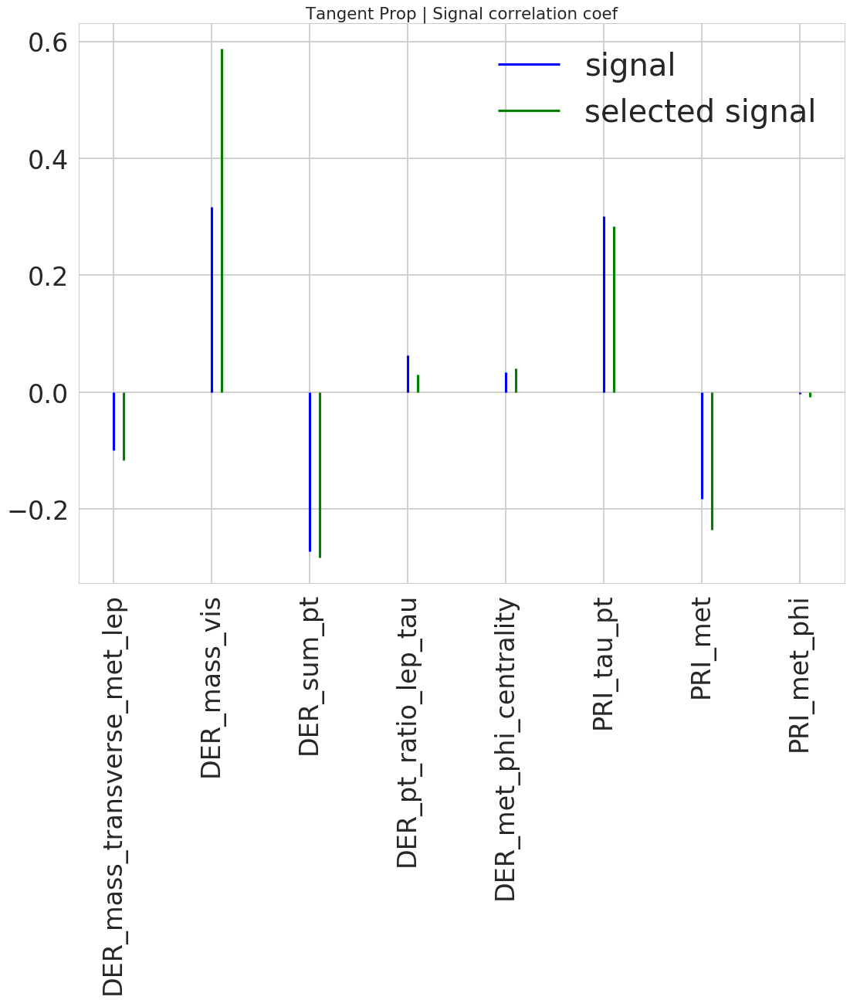

In [101]:
lines_max = [min(0, v) for v in sig_corrcoef]
lines_min = [max(0, v) for v in sig_corrcoef]
plt.vlines(range(len(skewed_var_idx)), lines_min, lines_max, colors='b', label='signal')
lines_max = [min(0, v) for v in sig_corrcoef_selected]
lines_min = [max(0, v) for v in sig_corrcoef_selected]
plt.vlines(np.arange(len(skewed_var_idx))+0.1, lines_min, lines_max, colors='g', label='selected signal')
plt.xticks(range(len(skewed_var_idx)), columns_names[skewed_var_idx], rotation='vertical')
plt.legend()
plt.title('{} | Signal correlation coef'.format(model_name))
plt.show()


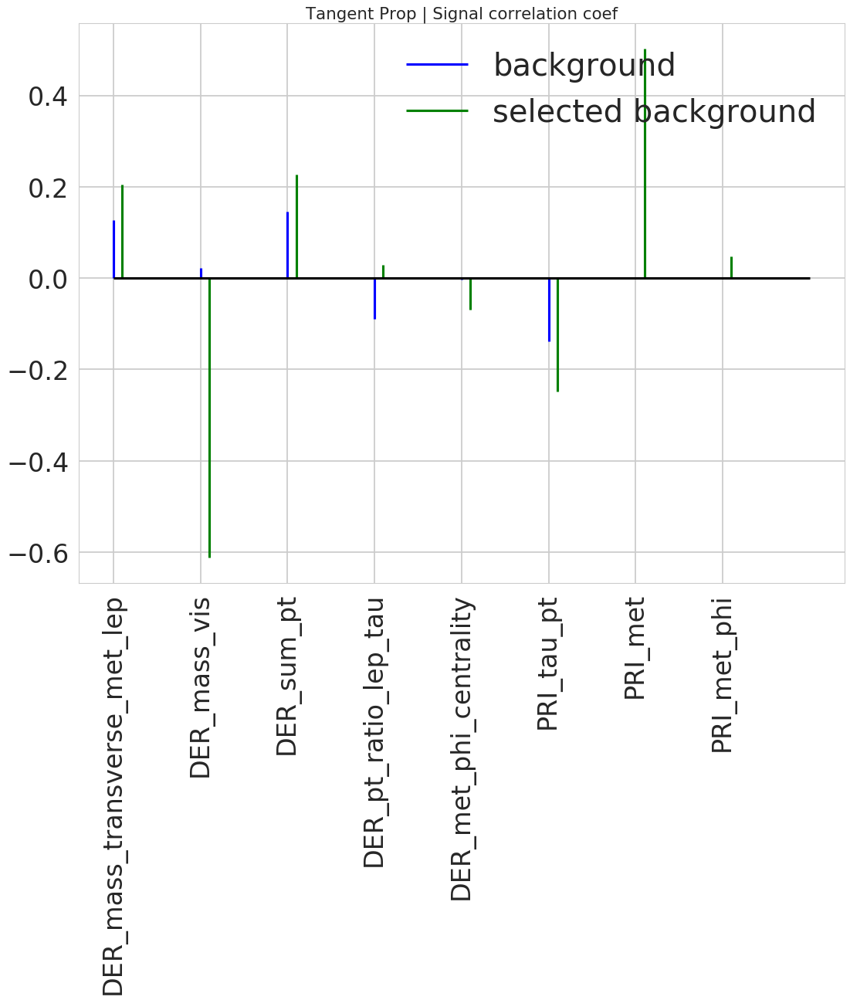

In [102]:

lines_max = [min(0, v) for v in bckg_corrcoef]
lines_min = [max(0, v) for v in bckg_corrcoef]
plt.vlines(range(len(skewed_var_idx)), lines_min, lines_max, colors='b', label='background')
lines_max = [min(0, v) for v in bckg_corrcoef_selected]
lines_min = [max(0, v) for v in bckg_corrcoef_selected]
plt.vlines(np.arange(len(skewed_var_idx))+0.1, lines_min, lines_max, colors='g', label='selected background')
plt.hlines(0, 0, len(skewed_var_idx))
plt.xticks(range(len(skewed_var_idx)), columns_names[skewed_var_idx], rotation='vertical')
plt.title('{} | Signal correlation coef'.format(model_name))
plt.legend()
plt.show()

## Same sign ?

In [110]:
np.unique(np.sign(X_noise[signal_idx, i]))

array([-1.,  1.], dtype=float32)

In [107]:
print('correlation coef adv -> tan')
print('---------------------------')
sig_corrcoef = []
bckg_corrcoef= []
for i in skewed_var_idx:
    cm = np.sum( np.abs(np.sign(X_noise[signal_idx, i]) + np.sign(X_tan[signal_idx, i])) == 2 ) / X_tan[signal_idx].shape[0]
    print("signal", columns_names[i], ':', cm )
    sig_corrcoef.append(cm)
    cm = np.sum( np.abs(np.sign(X_noise[background_idx, i]) + np.sign(X_tan[background_idx, i])) == 2 ) / X_tan[background_idx].shape[0]
    print("backgrounds", columns_names[i], ':', cm )
    bckg_corrcoef.append(cm)
    print()

correlation coef adv -> tan
---------------------------
signal DER_mass_transverse_met_lep : 0.21928897611050308
backgrounds DER_mass_transverse_met_lep : 0.7175914187125864

signal DER_mass_vis : 0.6058610408725517
backgrounds DER_mass_vis : 0.44454243790583076

signal DER_sum_pt : 0.7735781409216138
backgrounds DER_sum_pt : 0.17637720623091424

signal DER_pt_ratio_lep_tau : 0.10259652036079556
backgrounds DER_pt_ratio_lep_tau : 0.898543694671973

signal DER_met_phi_centrality : 0.39040268709665243
backgrounds DER_met_phi_centrality : 0.09002414313904905

signal PRI_tau_pt : 0.26848322451598294
backgrounds PRI_tau_pt : 0.7754357340506455

signal PRI_met : 0.5108691549986791
backgrounds PRI_met : 0.46179541170115423

signal PRI_met_phi : 0.3072989395025852
backgrounds PRI_met_phi : 0.28075494162652



In [103]:
# idx = np.random.choice(int(np.sum(y_test)), size=1000)
# plt.scatter(X_noise[signal_idx, 12][idx]+0.05, X_tan[signal_idx, 12][idx], label="signal")
# idx = np.random.choice(n_samples - int(np.sum(y_test)), size=1000)
# plt.scatter(X_noise[background_idx, 12][idx], X_tan[background_idx, 12][idx], label='background')
# plt.show()

In [62]:
# with sns.axes_style("white"):
#     cm = np.corrcoef(X_noise[signal_idx, 12], X_tan[signal_idx, 12], rowvar=False)
# #     cm = np.corrcoef(X_noise[background_idx, 12], X_tan[background_idx, 12], rowvar=False)
# #     cm = np.corrcoef(X_noise[:, 12], X_tan[:, 12], rowvar=False)

#     plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
#     plt.title("")
#     plt.colorbar()
#     # tick_marks = np.arange(len(classes))
#     # plt.xticks(tick_marks, classes, rotation=45)
#     # plt.yticks(tick_marks, classes)

#     thresh = cm.max() / 2.
#     for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
#         plt.text(j, i, format(cm[i, j], '.2f'),
#                  horizontalalignment="center",
#                  color="white" if cm[i, j] > thresh else "black")

# plt.tight_layout()
# plt.ylabel('')
# plt.xlabel('')
# plt.show()

# Influence on the networks

We want to know how the networks are influenced by the adversarial perturbation and by the TES perturbation.
$$ x + x_{adv} <-> x + x_{TES} $$

This may depend on :

- $\epsilon$ value used to compute $x_{adv}$
- The model (Pivot, TP, NN, ANN)
- The chosen threshold (we are interested in the selected events)

How to see the inlfuence ?

- Change in the loss distrib
- Change in the decision distrib

In [138]:
# Warning : X_noise is computed on the normalized data and X_tan is computed on the raw data
decision_origin = model.clf.predict_proba( X_test_u )[:, 1]
decision_adv = model.clf.predict_proba( X_test_u + X_noise )[:, 1]
decision_tan = model.predict_proba( X_test + X_tan )[:, 1]

In [139]:
import tempfile
tmpdir = tempfile.mkdtemp()


In [140]:
def display_gif(fname):
    from IPython.display import Image
    with open(fname,'rb') as f:
        display(Image(data=f.read(), format='gif'))

def display_png(fname):
    from IPython.display import Image
    with open(fname,'rb') as f:
        display(Image(data=f.read(), format='png'))

## Decision distrib vs epsilon with adversarial attack

In [ ]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    decision_adv = model.clf.predict_proba( X_test_u + e * X_noise )[:, 1]
    sns.distplot(decision_adv[y_test == 1], label='Higgs')
    sns.distplot(decision_adv[y_test == 0], label='Bckgd')
    plt.title('{} | adversarial, epsilon = {:.3f}'.format(model_name, e*0.1))
    plt.legend()
    plt.ylim(0, 10)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


In [ ]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


### On selected events

In [159]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    decision_adv = model.clf.predict_proba( X_test_u_selected + e * X_noise_selected )[:, 1]
    sns.distplot(decision_adv[y_test_selected == 1], label='Higgs')
    sns.distplot(decision_adv[y_test_selected == 0], label='Bckgd')
    plt.title('{} | adversarial, epsilon = {:.3f}'.format(model_name, e*0.1))
    plt.legend()
    plt.ylim(0, 150)
    plt.xlim(0, 1)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


cleaning /tmp/tmpa0p0cck3
making plots
Creating the gif


0

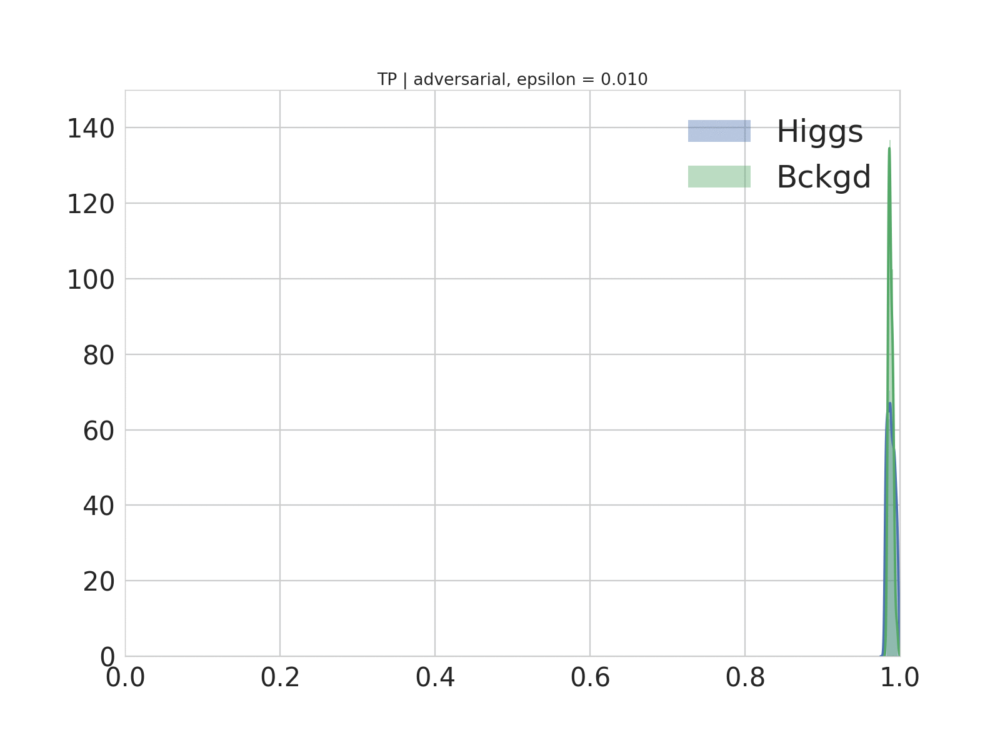

In [160]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


## Decision distrib vs epsilon with adversarial attack on TES variables only

In [ ]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    decision_adv = model.clf.predict_proba( X_test_u + e * X_noise_TES )[:, 1]
    sns.distplot(decision_adv[y_test == 1], label='Higgs')
    sns.distplot(decision_adv[y_test == 0], label='Bckgd')
    plt.title('{} | adversarial, epsilon = {:.3f}'.format(model_name, e*0.1))
    plt.legend()
    plt.ylim(0, 10)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


In [ ]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


### On selected events

In [161]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    decision_adv = model.clf.predict_proba( X_test_u_selected + e * X_noise_TES_selected )[:, 1]
    sns.distplot(decision_adv[y_test_selected == 1], label='Higgs')
    sns.distplot(decision_adv[y_test_selected == 0], label='Bckgd')
    plt.title('{} | adversarial, epsilon = {:.3f}'.format(model_name, e*0.1))
    plt.legend()
    plt.ylim(0, 150)
    plt.xlim(0, 1)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


cleaning /tmp/tmpa0p0cck3
making plots
Creating the gif


0

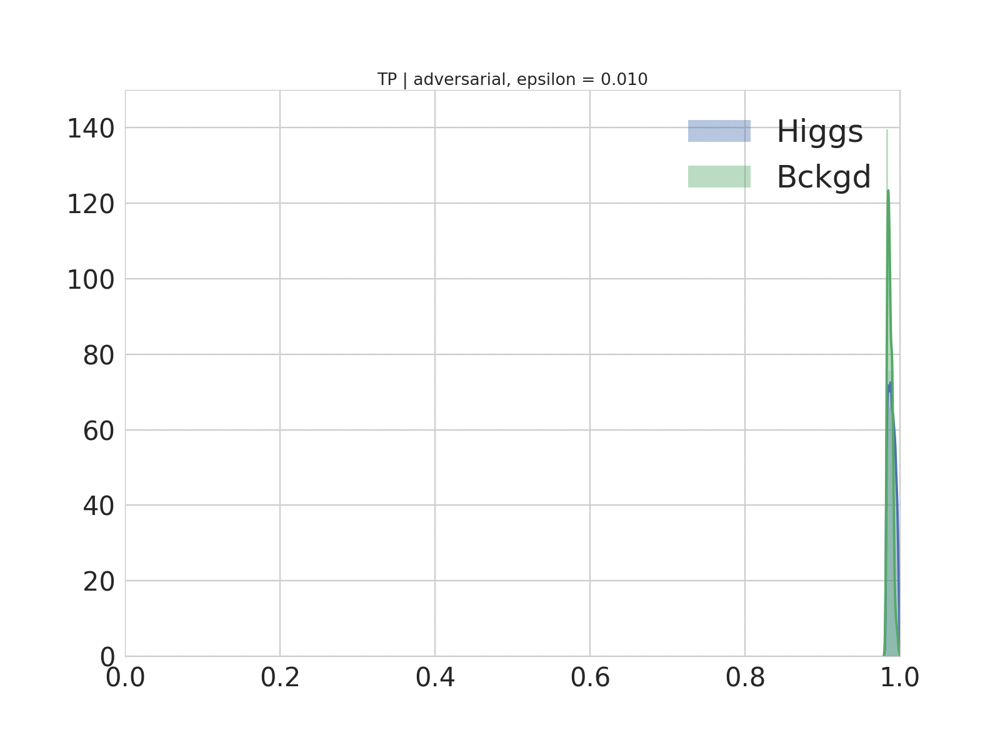

In [162]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


## Decision distrib vs alpha TAN

In [ ]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

sns.distplot(decision_origin[y_test == 1], label='Higgs')
sns.distplot(decision_origin[y_test == 0], label='Bckgd')
plt.title('Origin')
plt.ylim(0, 10)
plt.legend()
plt.savefig(os.path.join(tmpdir, 'a.png'))

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    decision_adv = model.predict_proba( X_test + e * X_tan )[:, 1]
    sns.distplot(decision_adv[y_test == 1], label='Higgs')
    sns.distplot(decision_adv[y_test == 0], label='Bckgd')
    plt.title('{} | tangent, epsilon = {:.2f}'.format(model_name, e))
    plt.legend()
    plt.ylim(0, 10)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


In [ ]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


## Decision distrib vs TES

**Cut included**

In [ ]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.linspace(0.9, 1.1, num=20)):
    plt.clf()
    test_data_tmp = skewing_function(test_data, z=e)
    X_tmp, y_tmp, _ = split_data_label_weights(test_data_tmp)
    X_tmp = pandas_to_numpy(X_tmp)

    decision_adv = model.predict_proba( X_tmp )[:, 1]
    sns.distplot(decision_adv[y_tmp == 1], label='Higgs')
    sns.distplot(decision_adv[y_tmp == 0], label='Bckgd')
    plt.title('{} | TES = {:.2f}'.format(model_name, e))
    plt.legend()
    plt.ylim(0, 10)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


In [ ]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


### On selected events

In [141]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.linspace(0.9, 1.1, num=20)):
    plt.clf()
    test_data_tmp = skew(test_data, z=e)
    X_tmp, y_tmp, _ = split_data_label_weights(test_data_tmp)
    X_tmp = pandas_to_numpy(X_tmp)

    decision_adv = model.predict_proba( X_tmp )[:, 1]
    decision_adv = decision_adv[idx_selected]
    y_tmp = y_tmp[idx_selected]
    # W_test_selected = W_test[idx_selected]
    sns.distplot(decision_adv[y_tmp == 1], label='Higgs')
    sns.distplot(decision_adv[y_tmp == 0], label='Bckgd')
    plt.title('{} | TES = {:.2f}'.format(model_name, e))
    plt.legend()
    plt.ylim(0, 150)
    plt.xlim(0.97, 1.01)
    plt.vlines(decision_threshold, 0, 150)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


cleaning /tmp/tmph8w287fn
making plots
Creating the gif


0

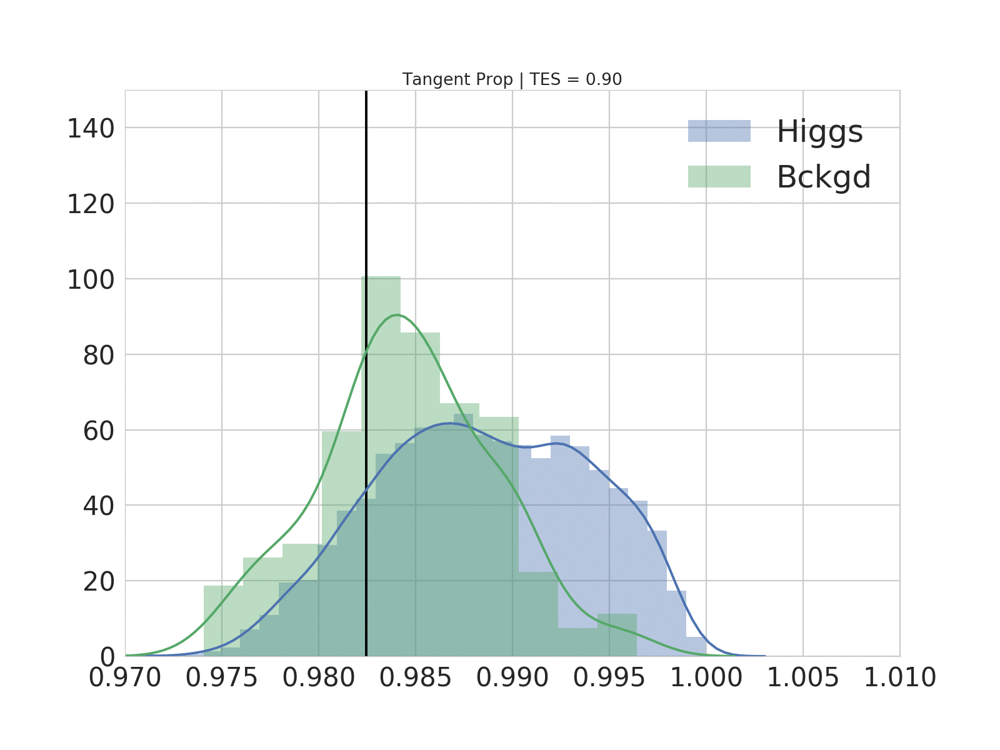

In [142]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


### Crazy values

In [ ]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    test_data_tmp = skew(test_data, z=e)
    X_tmp, y_tmp, _ = split_data_label_weights(test_data_tmp)
    X_tmp = pandas_to_numpy(X_tmp)

    decision_adv = model.predict_proba( X_tmp )[:, 1]
    sns.distplot(decision_adv[y_tmp == 1], label='Higgs')
    sns.distplot(decision_adv[y_tmp == 0], label='Bckgd')
    plt.title('{} | TES = {:.2f}'.format(model_name, e))
    plt.legend()
    plt.ylim(0, 10)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


In [ ]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


### Crazy values selected event only

In [180]:
print('cleaning', tmpdir)
os.system('rm {}/*'.format(tmpdir, tmpdir))

print('making plots')

for i, e in enumerate(np.logspace(-1, 1, num=30)):
    plt.clf()
    test_data_tmp = skew(test_data, z=e)
    X_tmp, y_tmp, _ = split_data_label_weights(test_data_tmp)
    X_tmp = pandas_to_numpy(X_tmp)

    decision_adv = model.predict_proba( X_tmp )[:, 1]
    decision_adv = decision_adv[idx_selected]
    y_tmp = y_tmp[idx_selected]
    # W_test_selected = W_test[idx_selected]
    sns.distplot(decision_adv[y_tmp == 1], label='Higgs')
    sns.distplot(decision_adv[y_tmp == 0], label='Bckgd')
    plt.title('{} | TES = {:.2f}'.format(model_name, e))
    plt.legend()
    plt.ylim(0, 150)
    plt.xlim(0, 1.01)
    plt.vlines(decision_threshold, 0, 150)
    plt.savefig(os.path.join(tmpdir, '{:02d}.png'.format(i)))
plt.clf()

print('Creating the gif', flush=True)
os.system('convert -delay 100 {}/*png {}/animation.gif'.format(tmpdir, tmpdir))


cleaning /tmp/tmpa0p0cck3
making plots
Creating the gif


0

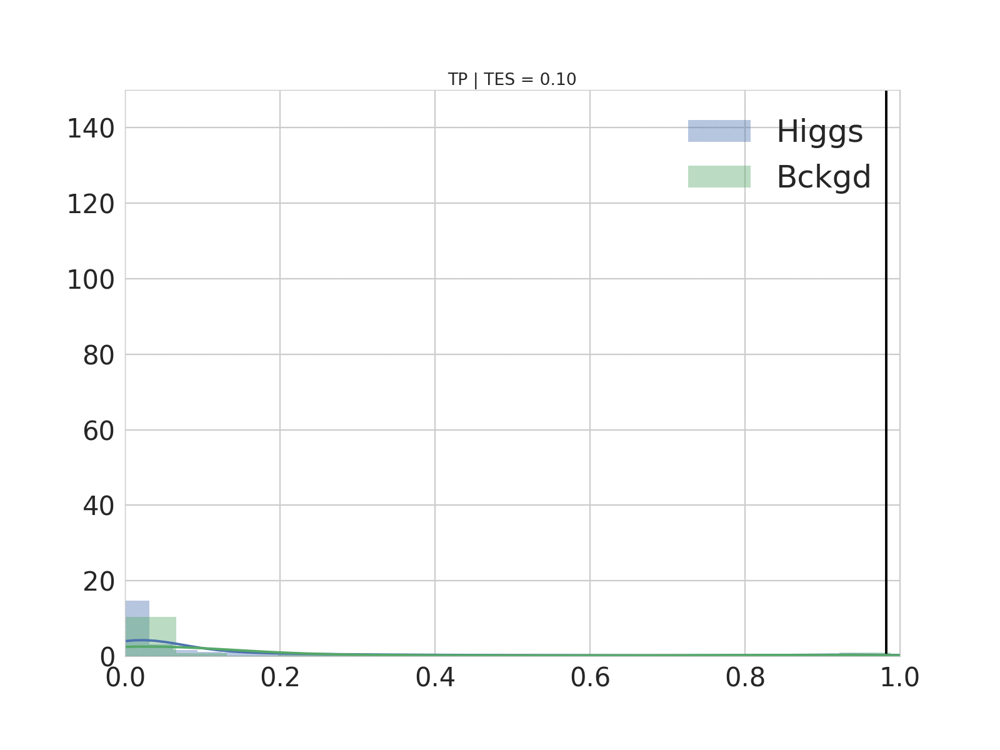

In [181]:
display_gif(os.path.join(tmpdir, 'animation.gif'))


# Measure distance between 2 distribs

- On the complete dataset
- On selected thresolds

# Playground


Qu'est-ce qu'on veut : Savoir si la perturbation est proche d'une perturbation adversariale.

Comment on peut le vérifier ?

- Déjà on peut grosièrement regarder les perturbations (histograms, imshow)
- De plus on peut regarder les correlations ?
- On peut aussi regader comment les perturbations affectent le décision (sur le dataset ou sur la région de selection parfaite)





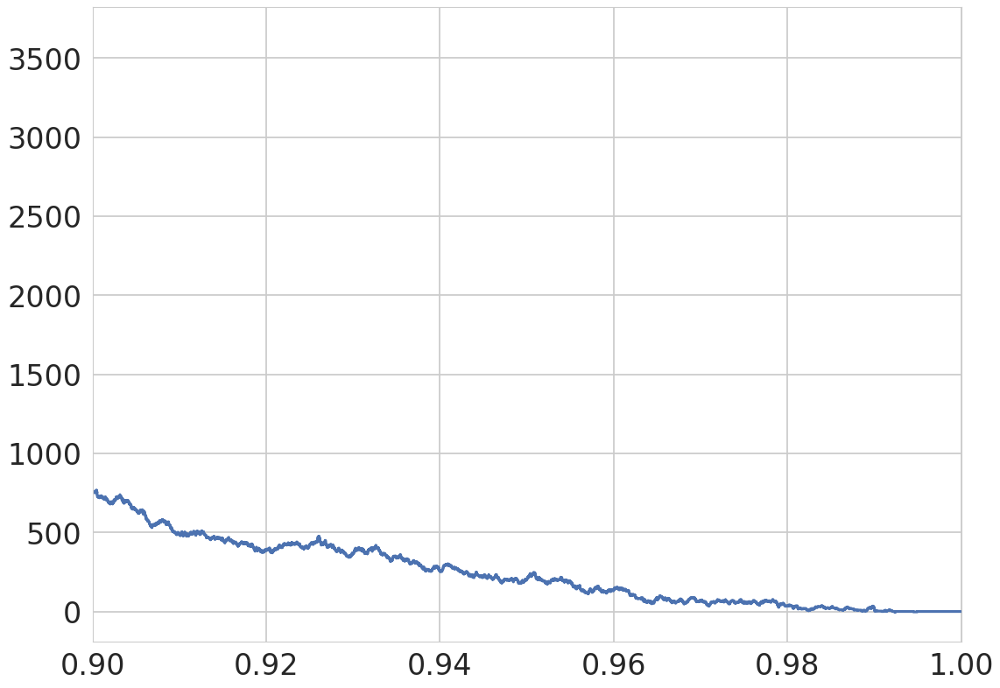

In [187]:
plt.plot(merged_decision, b-b0, label='absolute error')
plt.xlim(.9, 1)
plt.show()

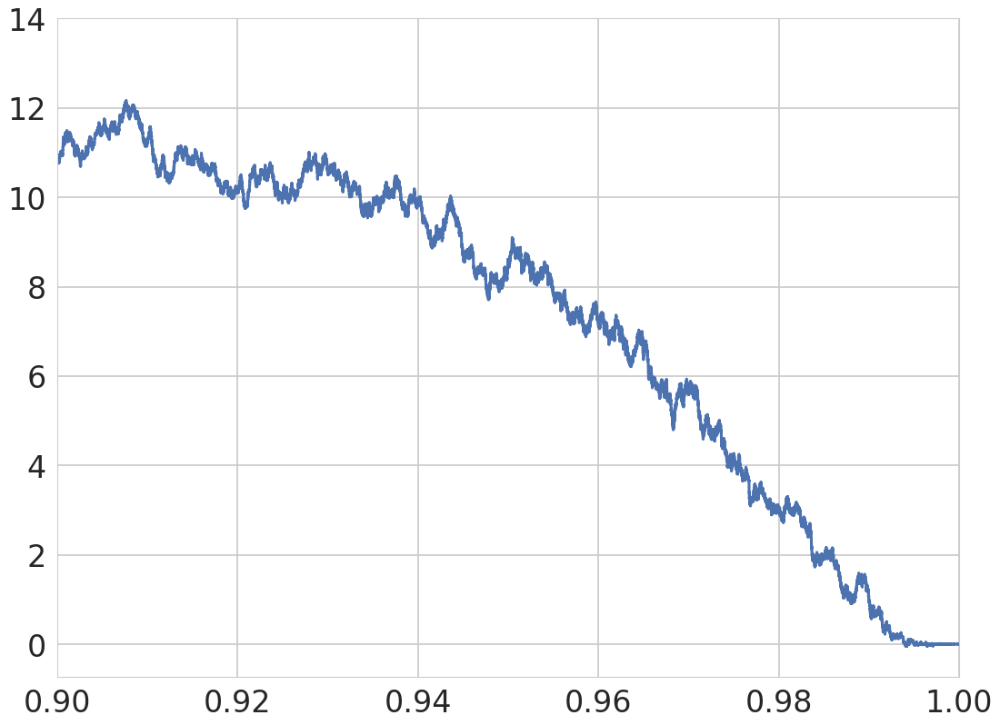

In [188]:
plt.plot(merged_decision,s-s0, label='absolute error')
plt.xlim(.9, 1)
plt.show()

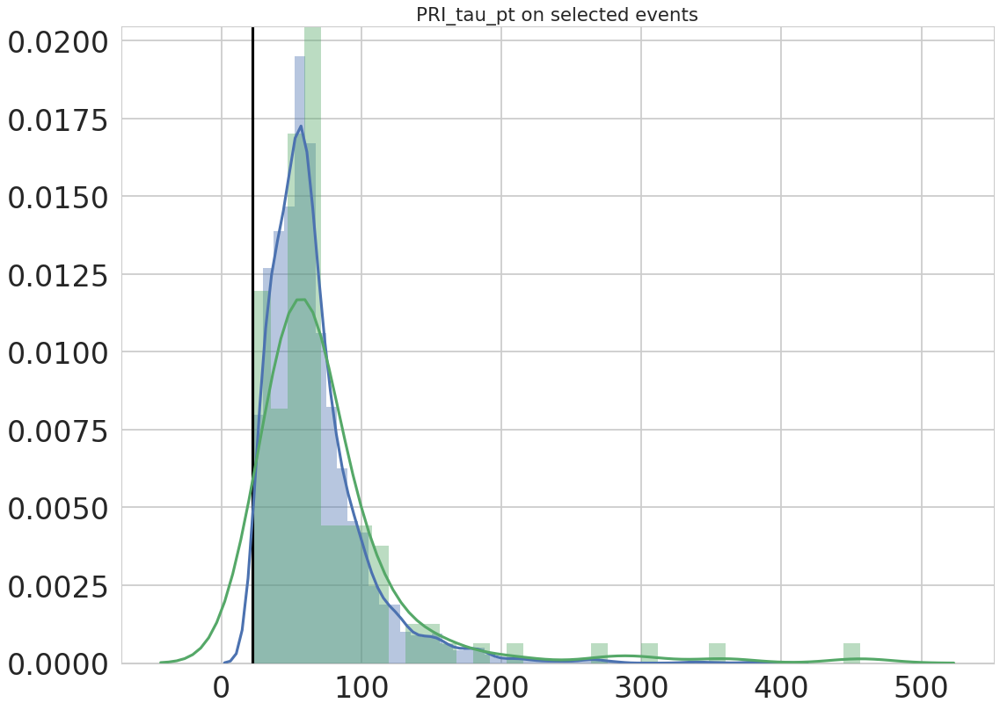

22.018


In [193]:
i = 12
sns.distplot(X_test_selected[selected_signal_idx, i])
sns.distplot(X_test_selected[selected_background_idx, i])
plt.vlines(X_test_selected[:, i].min(), 0, 0.1)
plt.title(columns_names[i]+' on selected events')
plt.show()
print(X_test_selected[:, i].min())

## Loop

decision_threshold = 0.98244655
smu min 0.610629405582225
kept 3.3 % of the events
0
decision_threshold = 0.9829395
smu min 0.44488280617615983
kept 2.8 % of the events
1
decision_threshold = 0.9812195
smu min 0.4959130504957384
kept 3.9 % of the events
2
decision_threshold = 0.9770263
smu min 0.5708706030382886
kept 4.6 % of the events
3
decision_threshold = 0.9760356
smu min 0.530023565119372
kept 4.7 % of the events
4
decision_threshold = 0.9788164
smu min 0.488402219792688
kept 4.8 % of the events
5
decision_threshold = 0.98279864
smu min 0.5906410947282512
kept 5.5 % of the events
6
decision_threshold = 0.99233234
smu min 0.49224132902600987
kept 1.3 % of the events
7
decision_threshold = 0.980117
smu min 0.544202732282939
kept 4.9 % of the events
8
decision_threshold = 0.97350097
smu min 0.4466184157140675
kept 6.1 % of the events
9
decision_threshold = 0.9792661
smu min 0.5188263968276385
kept 3.4 % of the events
10
decision_threshold = 0.9845919
smu min 0.46727985398164423
kept

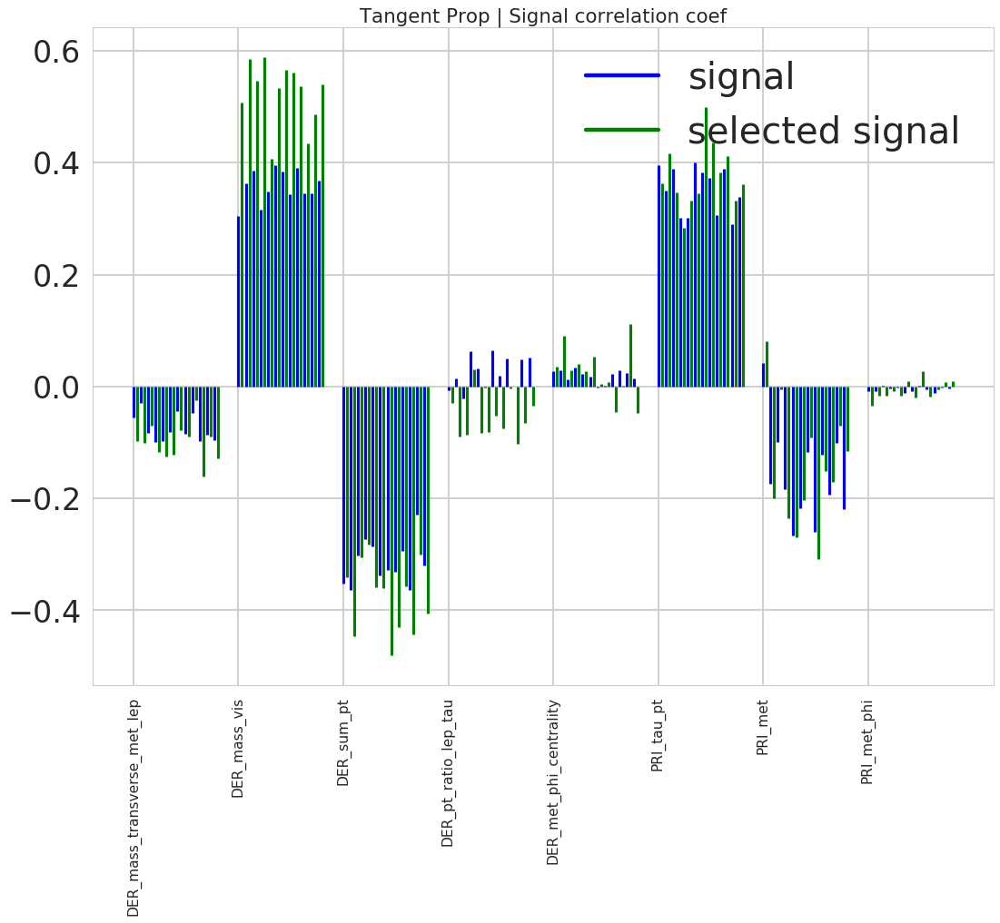

In [150]:
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),]

for i in range(12):
    cv_iter = get_cv_iter(data, data['Label'])
    idx_dev, idx_valid = cv_iter[i]

    _, test_data =  split_train_test(data, idx_dev, idx_valid)
    test_data = skewing_function(test_data, z=1.0)
    X_test, y_test, W_test = split_data_label_weights(test_data)
    columns_names = X_test.columns
    X_tan = tangent(X_test)
    X_test = pandas_to_numpy(X_test)
    X_tan = pandas_to_numpy(X_tan)
    y_test = pandas_to_numpy(y_test)

    # Choose model
    model = TP_models[i]
    model_name = 'Tangent Prop'
    if hasattr(model, 'classifier'):
        model.clf = model.classifier

    n_samples = X_test.shape[0]

    # Produce adversarial attacks
    X_noise = fast_gradient_sign_adversarial_noise(model, X_test, y_test, epsilon=0.1)

    # Find TES variables
    skewed_var_idx = [i for i in range(X_tan.shape[1]) if np.count_nonzero(X_tan[:, i]) > 0]

    # Adversarial attacks on TES variables only
    X_noise_TES = np.zeros_like(X_noise)
    for j in skewed_var_idx:
        X_noise_TES[:, j] = np.copy(X_noise[:, j])

    # Get normalized data
    X_test_u = model.scaler.transform(X_test)


    signal_idx = (y_test == 1)
    background_idx = (y_test == 0)
    signals_weights = W_test[signal_idx]
    backgrounds_weights = W_test[background_idx]

    CHOSEN_TES = 1.03

    decision = model.predict_proba(X_test)[:, 1]
    decision_sorted, s0, b0 = decision_TP_FP(decision, y_test, W_test)

    test_data_skewed = skewing_function(test_data, z=CHOSEN_TES)
    X_test_skewed, y_test_skewed, W_test_skewed = split_data_label_weights(test_data_skewed)
    X_test_skewed = pandas_to_numpy(X_test_skewed)
    decision_skewed = model.predict_proba(X_test_skewed)[:, 1]
    decision_skewed_sorted, s, b = decision_TP_FP(decision_skewed, y_test_skewed, W_test_skewed)


    # -------------------------------------------------------------
    # SELECTED EVENTS
    merged_decision, indexes = merge_abscisse(decision_sorted, decision_skewed_sorted)
    idx_0 = indexes[0]
    idx_skewed = indexes[1]
    s0 = s0[idx_0]
    b0 = b0[idx_0]
    s = s[idx_skewed]
    b = b[idx_skewed]

    estat = error_stat(s0, b0)
    esyst = error_syst(s, b, s0, b0)
    smu = sigma_mu(s, b, s0, b0)

    idx_min = np.argmin(smu)
    decision_threshold = merged_decision[idx_min]
    print('decision_threshold =', decision_threshold)
    print('smu min', np.min(smu))

    idx_selected = decision > decision_threshold
    X_test_selected = X_test[idx_selected]
    X_test_u_selected = X_test_u[idx_selected]
    y_test_selected = y_test[idx_selected]
    W_test_selected = W_test[idx_selected]

    X_tan_selected = X_tan[idx_selected]
    X_noise_selected = X_noise[idx_selected]
    X_noise_TES_selected = X_noise_TES[idx_selected]

    print('kept {:2.1f} % of the events'.format(X_test_selected.shape[0]/X_test.shape[0]*100))

    selected_signal_idx = (y_test_selected == 1)
    selected_background_idx = (y_test_selected == 0)
    selected_signals_weights = W_test_selected[selected_signal_idx]
    selected_backgrounds_weights = W_test_selected[selected_background_idx]
    
    # -------------------------------------------------------------
    # PLOT
    sig_corrcoef = []
    bckg_corrcoef= []
    sig_corrcoef_selected = []
    bckg_corrcoef_selected = []
    for j in skewed_var_idx:
        cm = np.corrcoef(X_noise[signal_idx, j], X_tan[signal_idx, j], rowvar=False)
        sig_corrcoef.append(cm[0,1])
        #cm = np.corrcoef(X_noise[background_idx, j], X_tan[background_idx, j], rowvar=False)
        #bckg_corrcoef.append(cm[0,1])
        cm = np.corrcoef(X_noise_selected[selected_signal_idx, j], X_tan_selected[selected_signal_idx, j], rowvar=False)
        sig_corrcoef_selected.append(cm[0,1])
        #cm = np.corrcoef(X_noise_selected[selected_background_idx, j], X_tan_selected[selected_background_idx, j], 
        #                 rowvar=False)
        #bckg_corrcoef_selected.append(cm[0,1])

    print(i)
    lines_max = [min(0, v) for v in sig_corrcoef]
    lines_min = [max(0, v) for v in sig_corrcoef]
    plt.vlines(np.arange(len(skewed_var_idx))+i*0.07, lines_min, lines_max, colors='b', label='signal')
    lines_max = [min(0, v) for v in sig_corrcoef_selected]
    lines_min = [max(0, v) for v in sig_corrcoef_selected]
    plt.vlines(np.arange(len(skewed_var_idx))+i*0.07+0.035, lines_min, lines_max, colors='g', label='selected signal')
plt.xticks(range(len(skewed_var_idx)), columns_names[skewed_var_idx], rotation='vertical', fontsize=14)
plt.legend(custom_lines, ['signal', 'selected signal'])
plt.title('{} | Signal correlation coef'.format(model_name))
plt.show()


decision_threshold = 0.98244655
smu min 0.610629405582225
kept 3.3 % of the events
0
decision_threshold = 0.9829395
smu min 0.44488280617615983
kept 2.8 % of the events
1
decision_threshold = 0.9812195
smu min 0.4959130504957384
kept 3.9 % of the events
2
decision_threshold = 0.9770263
smu min 0.5708706030382886
kept 4.6 % of the events
3
decision_threshold = 0.9760356
smu min 0.530023565119372
kept 4.7 % of the events
4
decision_threshold = 0.9788164
smu min 0.488402219792688
kept 4.8 % of the events
5
decision_threshold = 0.98279864
smu min 0.5906410947282512
kept 5.5 % of the events
6
decision_threshold = 0.99233234
smu min 0.49224132902600987
kept 1.3 % of the events
7


/home/tao/vestrade/miniconda3/envs/py35/lib/python3.5/site-packages/numpy/lib/function_base.py:3183: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/tao/vestrade/miniconda3/envs/py35/lib/python3.5/site-packages/numpy/lib/function_base.py:3184: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


decision_threshold = 0.980117
smu min 0.544202732282939
kept 4.9 % of the events
8
decision_threshold = 0.97350097
smu min 0.4466184157140675
kept 6.1 % of the events
9
decision_threshold = 0.9792661
smu min 0.5188263968276385
kept 3.4 % of the events
10
decision_threshold = 0.9845919
smu min 0.46727985398164423
kept 3.9 % of the events
11


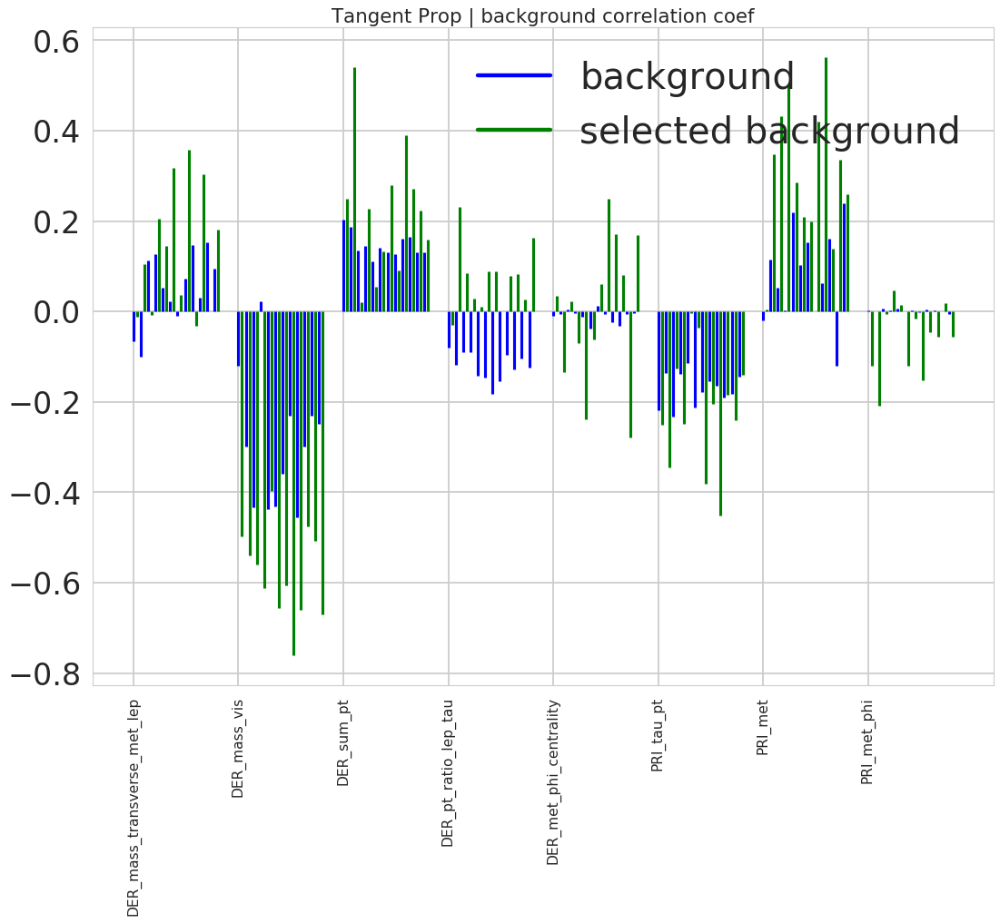

In [151]:
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='b', lw=4),
                Line2D([0], [0], color='g', lw=4),]

for i in range(12):
    cv_iter = get_cv_iter(data, data['Label'])
    idx_dev, idx_valid = cv_iter[i]

    _, test_data =  split_train_test(data, idx_dev, idx_valid)
    test_data = skewing_function(test_data, z=1.0)
    X_test, y_test, W_test = split_data_label_weights(test_data)
    columns_names = X_test.columns
    X_tan = tangent(X_test)
    X_test = pandas_to_numpy(X_test)
    X_tan = pandas_to_numpy(X_tan)
    y_test = pandas_to_numpy(y_test)

    # Choose model
    model = TP_models[i]
    model_name = 'Tangent Prop'
    if hasattr(model, 'classifier'):
        model.clf = model.classifier

    n_samples = X_test.shape[0]

    # Produce adversarial attacks
    X_noise = fast_gradient_sign_adversarial_noise(model, X_test, y_test, epsilon=0.1)

    # Find TES variables
    skewed_var_idx = [i for i in range(X_tan.shape[1]) if np.count_nonzero(X_tan[:, i]) > 0]

    # Adversarial attacks on TES variables only
    X_noise_TES = np.zeros_like(X_noise)
    for j in skewed_var_idx:
        X_noise_TES[:, j] = np.copy(X_noise[:, j])

    # Get normalized data
    X_test_u = model.scaler.transform(X_test)


    signal_idx = (y_test == 1)
    background_idx = (y_test == 0)
    signals_weights = W_test[signal_idx]
    backgrounds_weights = W_test[background_idx]

    CHOSEN_TES = 1.03

    decision = model.predict_proba(X_test)[:, 1]
    decision_sorted, s0, b0 = decision_TP_FP(decision, y_test, W_test)

    test_data_skewed = skewing_function(test_data, z=CHOSEN_TES)
    X_test_skewed, y_test_skewed, W_test_skewed = split_data_label_weights(test_data_skewed)
    X_test_skewed = pandas_to_numpy(X_test_skewed)
    decision_skewed = model.predict_proba(X_test_skewed)[:, 1]
    decision_skewed_sorted, s, b = decision_TP_FP(decision_skewed, y_test_skewed, W_test_skewed)


    # -------------------------------------------------------------
    # SELECTED EVENTS
    merged_decision, indexes = merge_abscisse(decision_sorted, decision_skewed_sorted)
    idx_0 = indexes[0]
    idx_skewed = indexes[1]
    s0 = s0[idx_0]
    b0 = b0[idx_0]
    s = s[idx_skewed]
    b = b[idx_skewed]

    estat = error_stat(s0, b0)
    esyst = error_syst(s, b, s0, b0)
    smu = sigma_mu(s, b, s0, b0)

    idx_min = np.argmin(smu)
    decision_threshold = merged_decision[idx_min]
    print('decision_threshold =', decision_threshold)
    print('smu min', np.min(smu))

    idx_selected = decision > decision_threshold
    X_test_selected = X_test[idx_selected]
    X_test_u_selected = X_test_u[idx_selected]
    y_test_selected = y_test[idx_selected]
    W_test_selected = W_test[idx_selected]

    X_tan_selected = X_tan[idx_selected]
    X_noise_selected = X_noise[idx_selected]
    X_noise_TES_selected = X_noise_TES[idx_selected]

    print('kept {:2.1f} % of the events'.format(X_test_selected.shape[0]/X_test.shape[0]*100))

    selected_signal_idx = (y_test_selected == 1)
    selected_background_idx = (y_test_selected == 0)
    selected_signals_weights = W_test_selected[selected_signal_idx]
    selected_backgrounds_weights = W_test_selected[selected_background_idx]
    
    # -------------------------------------------------------------
    # PLOT
    sig_corrcoef = []
    bckg_corrcoef= []
    sig_corrcoef_selected = []
    bckg_corrcoef_selected = []
    for j in skewed_var_idx:
        #cm = np.corrcoef(X_noise[signal_idx, j], X_tan[signal_idx, j], rowvar=False)
        #sig_corrcoef.append(cm[0,1])
        cm = np.corrcoef(X_noise[background_idx, j], X_tan[background_idx, j], rowvar=False)
        bckg_corrcoef.append(cm[0,1])
        #cm = np.corrcoef(X_noise_selected[selected_signal_idx, j], X_tan_selected[selected_signal_idx, j], rowvar=False)
        #sig_corrcoef_selected.append(cm[0,1])
        cm = np.corrcoef(X_noise_selected[selected_background_idx, j], X_tan_selected[selected_background_idx, j], 
                         rowvar=False)
        bckg_corrcoef_selected.append(cm[0,1])

    print(i)
    lines_max = [min(0, v) for v in bckg_corrcoef]
    lines_min = [max(0, v) for v in bckg_corrcoef]
    plt.vlines(np.arange(len(skewed_var_idx))+i*0.07, lines_min, lines_max, colors='b', label='background')
    lines_max = [min(0, v) for v in bckg_corrcoef_selected]
    lines_min = [max(0, v) for v in bckg_corrcoef_selected]
    plt.vlines(np.arange(len(skewed_var_idx))+i*0.07+0.035, lines_min, lines_max, colors='g', label='selected background')
plt.xticks(range(len(skewed_var_idx)), columns_names[skewed_var_idx], rotation='vertical', fontsize=14)
plt.legend(custom_lines, ['background', 'selected background'])
plt.title('{} | background correlation coef'.format(model_name))
plt.show()
